In [1]:
# loading the model
import tensorflow as tf 
from tensorflow.keras import layers 
import numpy as np 
from tensorflow.keras.models import load_model 

model = load_model('cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_21 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 15, 15, 128)       1

In [2]:
# loading the image to test
img_path = "/content/IMG_20210222_213645.jpg"
from tensorflow.keras.preprocessing import image 
import numpy as np 

img = image.load_img(img_path, target_size = (150,150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis = 0)
img_tensor = img_tensor / 255

In [3]:
import matplotlib.pyplot as plt 

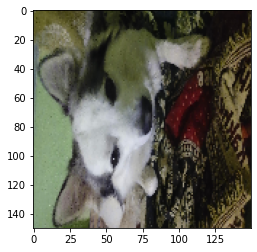

In [4]:
plt.imshow(img_tensor[0])

In [5]:
# in order to extract the feature maps to look at we will create
# a keras model that takes batches of image as input and outputs the activations
from tensorflow.keras import models

# extracts the output of top eight layers
layer_outputs = [layer.output for layer in model.layers[:8]]

# creating a model that inputs the trained model input and outputs
# all the dilensions of activation layers
activation_model = models.Model(inputs = model.input, outputs = layer_outputs)

In [6]:
# in this case we are extracting all the outputs of the base conv layer 
# feeding this to a keras Model class which taekes inputs and bunch of outputs
# in this case this model takes one input and various outputs 

# Visualizing the activations for one layer

In [48]:
# when fed an image to this new model this model returns the value of layer activation 
# in original model 
activations = activation_model.predict(img_tensor)
this_activation = activations[0]
image_dim = this_activation.shape[1]
images_per_row = 16
images_per_column = layers_to_output // images_per_row
image_grid = np.zeros((images_per_row * image_dim,images_per_column * image_dim))
image_grid.shape

i = 0
for this_col in range(images_per_row):
  for this_row in range(images_per_column):
    
    this_image = this_activation[0,:,:,i]
    i+= 1
    this_image_mean = np.mean(this_image)
    this_image_std = np.std(this_image)
    this_image = (this_image - this_image_mean) / this_image_std
    this_image = this_image * 64 + 128
    this_image = np.clip(this_image,0, 255).astype(np.uint8)
    image_grid[this_col * image_dim:(this_col + 1) * image_dim, this_row * image_dim: (this_row + 1) * image_dim] = this_image


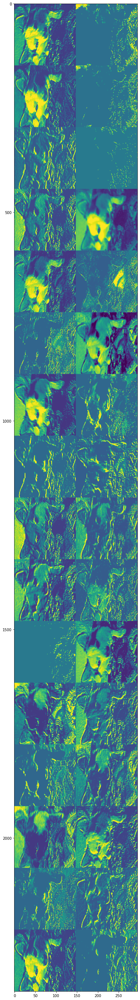

In [53]:
plt.figure(figsize = (10,50))
plt.imshow(image_grid)

# Visualizing activations for all the layers

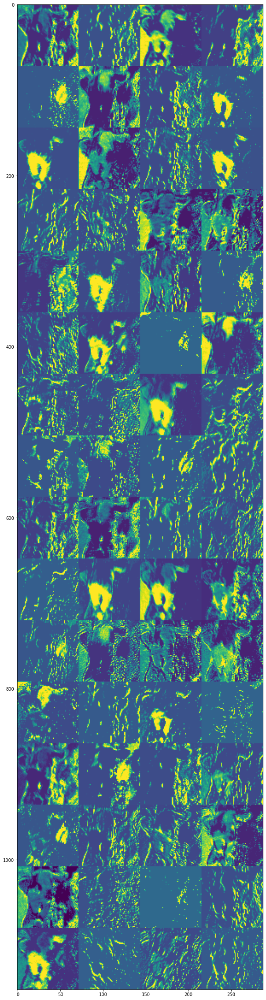

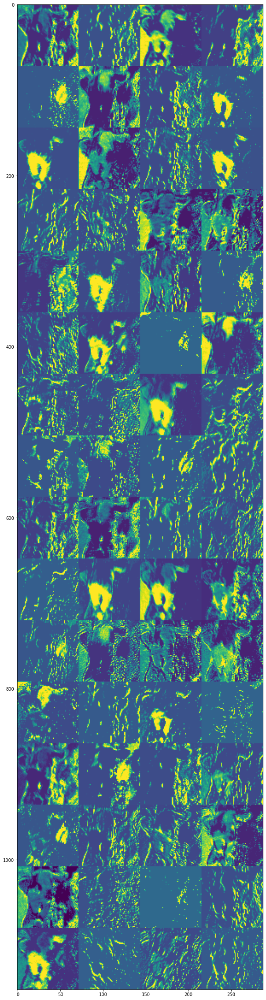

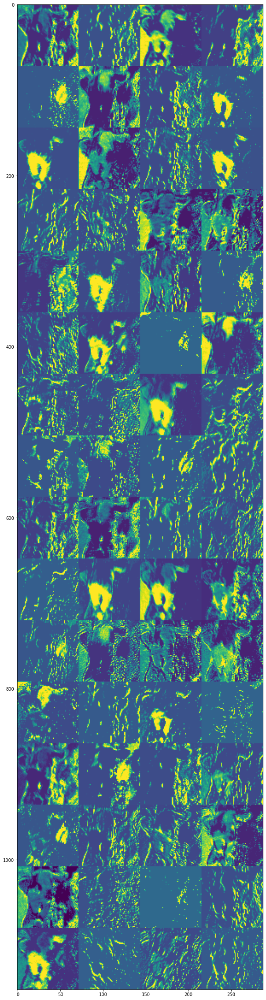

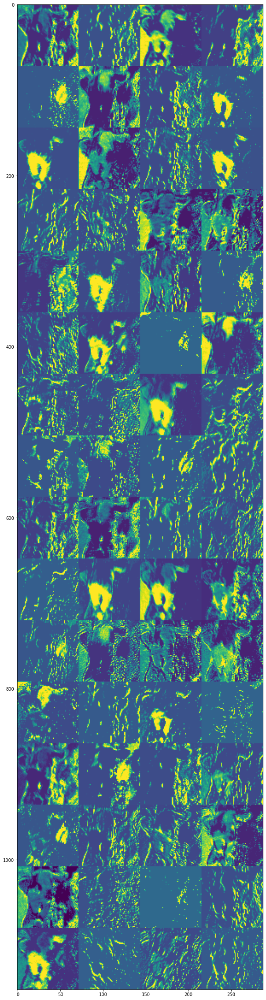

In [88]:
for layer,this_activation in zip(layer_outputs,activations):
  images_per_row = 16
  #this_activation = activations[2]
  # all the channels to output
  layers_to_output = this_activation[0].shape[-1]
  images_per_column = layers_to_output // images_per_row
  image_dim = this_activation.shape[1]
  # creating a grid to store all the images
  image_grid = np.zeros((images_per_row * image_dim,images_per_column * image_dim))
  image_grid.shape
  # only draw if the layer is conv_2d
  if layer.name.startswith('conv2d'):
    i = 0
    for this_col in range(images_per_row):
      for this_row in range(images_per_column):
        
        this_image = this_activation[0,:,:,i]
        i+= 1
        this_image_mean = np.mean(this_image)
        this_image_std = np.std(this_image)
        this_image = (this_image - this_image_mean) / this_image_std
        this_image = this_image * 64 + 128
        this_image = np.clip(this_image,0, 255).astype(np.uint8)
        image_grid[this_col * image_dim:(this_col + 1) * image_dim, this_row * image_dim: (this_row + 1) * image_dim] = this_image
    
    plt.figure(figsize = (10,50))
    plt.imshow(image_grid)

In [80]:
layers_to_output

64

In [82]:
image_dim = this_activation.shape[1]

(1, 72, 72, 64)